#### setup (if on colab)

In [ ]:
!pip install faccent==1.0

#### quick start

In [4]:
from faccent import render, param, transform, objectives

In [2]:
#load model
import torch
from faccent.modelzoo import inceptionv1

DEVICE = 'cuda:0'
model = inceptionv1(pretrained=True)
_ = model.to(DEVICE).eval()
# MODEL_INPUT_SIZE = model.model_input_size
# MODEL_INPUT_RANGE = model.model_input_range
# IMG_SIZE = (512,512)


#labels for model
with open('./faccent/modelzoo/inceptionv1/inception_labels.txt', 'r') as f:
    category_targets= f.read().splitlines()


/mnt/data/chris/dropbox/Research-Hamblin/Projects/faccent/env/lib/python3.7/site-packages/torch/cuda/__init__.py:132: UserWarning: 
    Found GPU3 Tesla K40c which is of cuda capability 3.5.
    PyTorch no longer supports this GPU because it is too old.
    The minimum cuda capability supported by this library is 3.7.
    
  warnings.warn(old_gpu_warn % (d, name, major, minor, min_arch // 10, min_arch % 10))


In [3]:
#image to accentuate
img_path = './test_images/iguana.jpg/'

#feature to accentuate (logit)
layer = 'softmax2_pre_activation_matmul'

#label = 'monarch'
label = 'loggerhead'
unit = category_targets.index(label)

initializing parameterization with ./test_images/iguana.jpg/
reg_layer arg set, but not reg_alpha, use reg_alpha=1
using parameterizer.standard_transforms
Initial loss: -13.477
obj/reg ratio: 0.18968342562294535
setting reg balance parameter to this ratio


  0%|          | 0/99 [00:00<?, ?it/s]

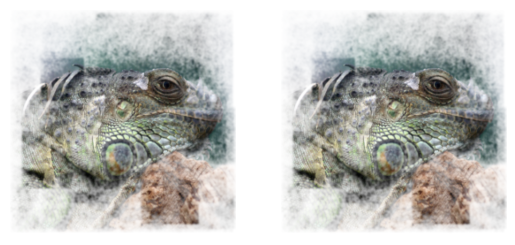

 10%|█         | 10/99 [00:02<00:17,  5.23it/s]

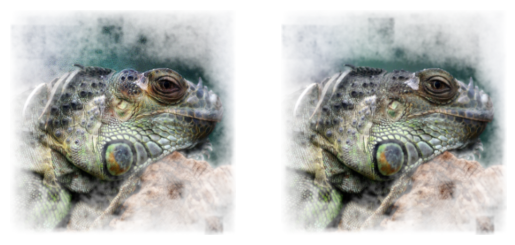

 20%|██        | 20/99 [00:04<00:14,  5.40it/s]

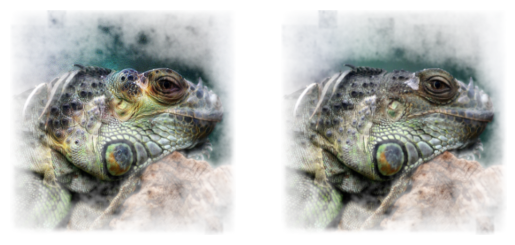

 30%|███       | 30/99 [00:06<00:12,  5.43it/s]

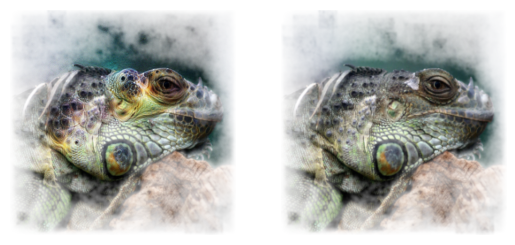

 40%|████      | 40/99 [00:08<00:10,  5.42it/s]

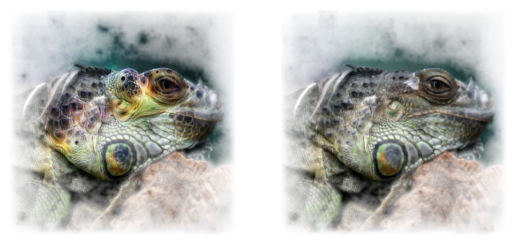

 51%|█████     | 50/99 [00:10<00:09,  5.44it/s]

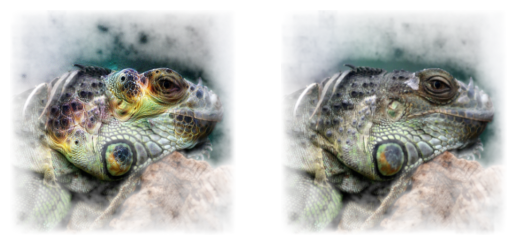

 61%|██████    | 60/99 [00:12<00:07,  5.42it/s]

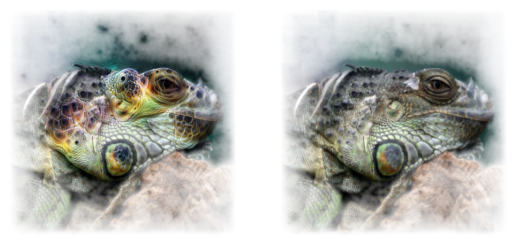

 71%|███████   | 70/99 [00:14<00:05,  5.42it/s]

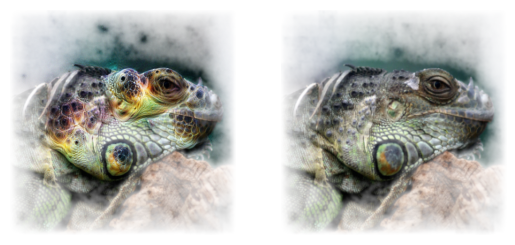

 81%|████████  | 80/99 [00:16<00:03,  5.40it/s]

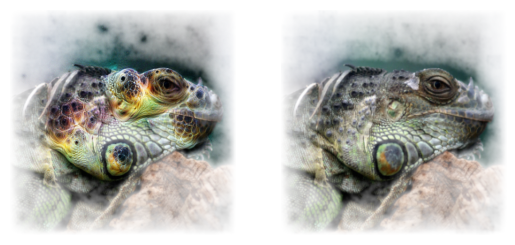

 91%|█████████ | 90/99 [00:18<00:01,  5.34it/s]

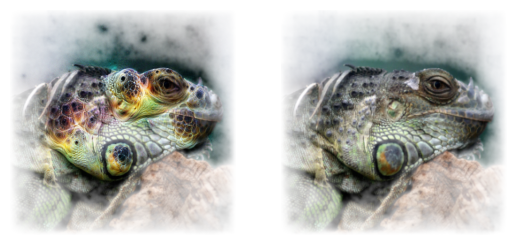

 99%|█████████▉| 98/99 [00:20<00:00,  5.30it/s]

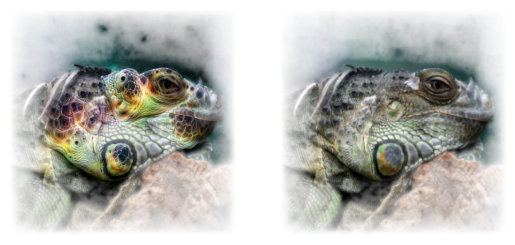

100%|██████████| 99/99 [00:20<00:00,  4.78it/s]


In [4]:
obj = layer+':'+str(unit)
imgs, img_trs, _, _ = render.render_vis(
                                    model,
                                    obj,
                                    init_img = img_path,
                                    accent_reg_layer = 'mixed3a'
                                  )

In [5]:
#an interactive widget

from faccent.utils import accent_widget

accent_widget(imgs, img_trs)

interactive(children=(IntSlider(value=0, description='Opt Steps:', max=49), FloatSlider(value=100.0, descripti…

#### normal (noise-seeded) feature visualization

no image specified, so intializing with random noise"
using parameterizer.standard_transforms


  0%|          | 0/99 [00:00<?, ?it/s]

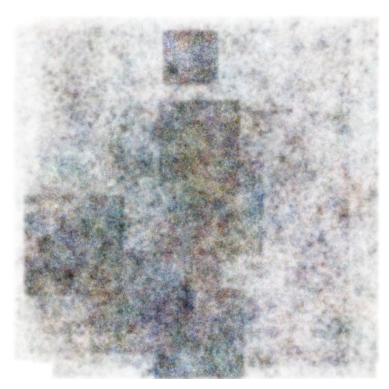

  9%|▉         | 9/99 [00:00<00:06, 13.45it/s]

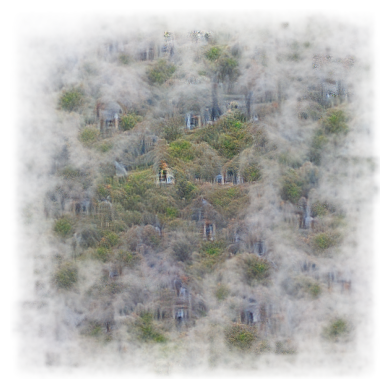

 19%|█▉        | 19/99 [00:01<00:05, 14.08it/s]

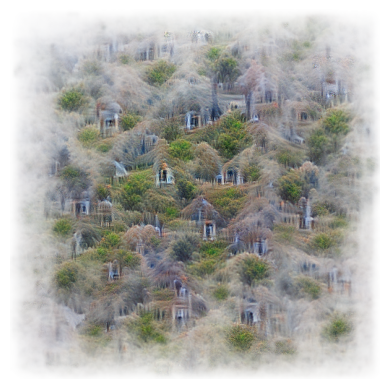

 29%|██▉       | 29/99 [00:02<00:04, 14.20it/s]

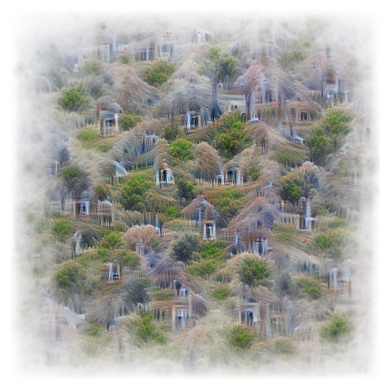

 39%|███▉      | 39/99 [00:03<00:04, 13.62it/s]

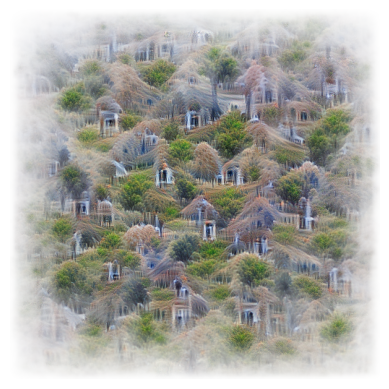

 49%|████▉     | 49/99 [00:04<00:03, 13.50it/s]

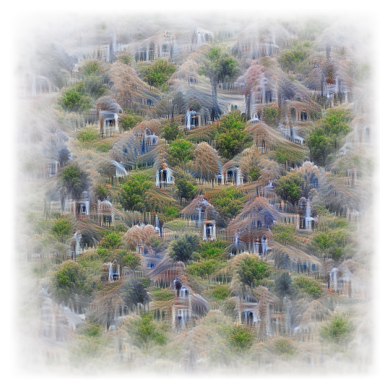

 60%|█████▉    | 59/99 [00:04<00:02, 13.40it/s]

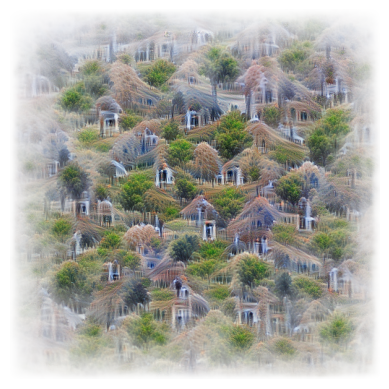

 70%|██████▉   | 69/99 [00:05<00:02, 12.82it/s]

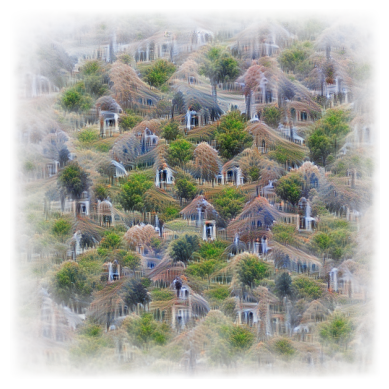

 80%|███████▉  | 79/99 [00:06<00:01, 13.59it/s]

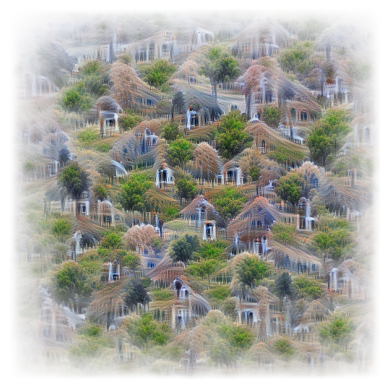

 90%|████████▉ | 89/99 [00:07<00:00, 13.53it/s]

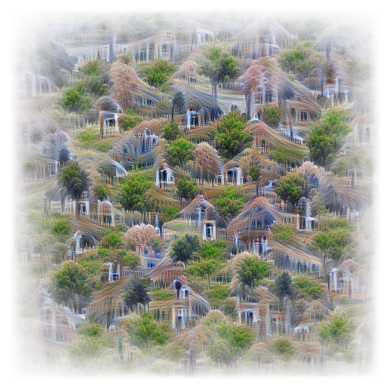

 98%|█████████▊| 97/99 [00:08<00:00, 12.97it/s]

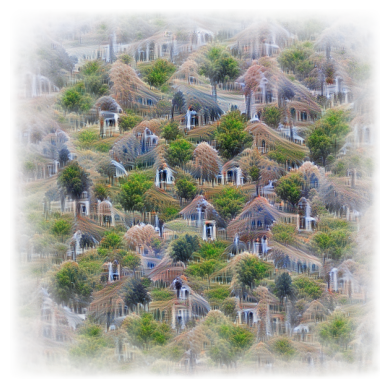

100%|██████████| 99/99 [00:08<00:00, 11.63it/s]


In [6]:
_ = render.render_vis(model, "mixed4a:475") 

#### latent accentuation

initializing parameterization with test_images/fox.jpg
using parameterizer.standard_transforms
Initial loss: -25.098
obj/reg ratio: 1.2592268125254416
setting reg balance parameter to this ratio


  0%|          | 0/99 [00:00<?, ?it/s]

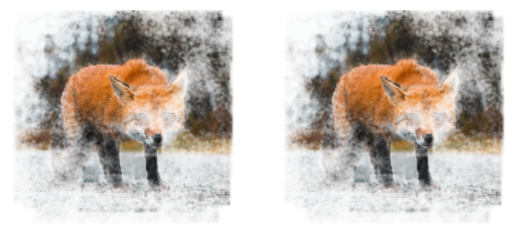

 10%|█         | 10/99 [00:01<00:12,  7.25it/s]

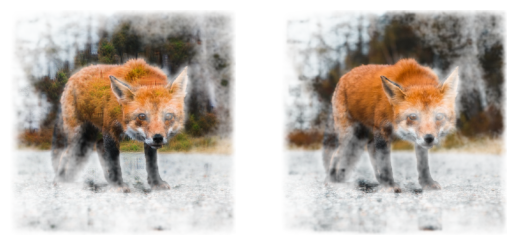

 20%|██        | 20/99 [00:03<00:10,  7.25it/s]

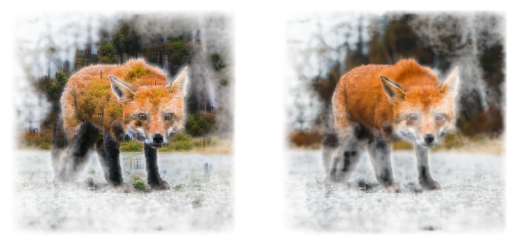

 30%|███       | 30/99 [00:04<00:09,  7.22it/s]

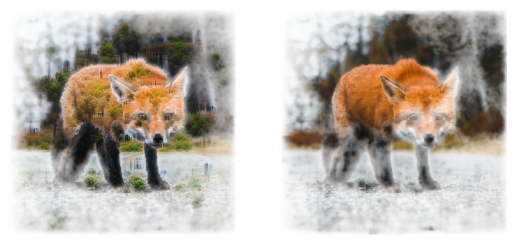

 40%|████      | 40/99 [00:06<00:08,  7.22it/s]

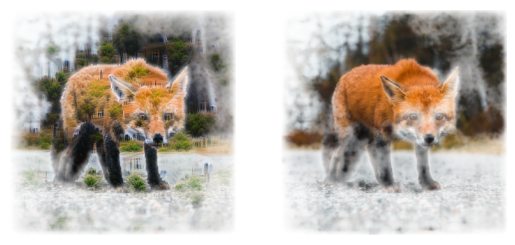

 51%|█████     | 50/99 [00:07<00:06,  7.22it/s]

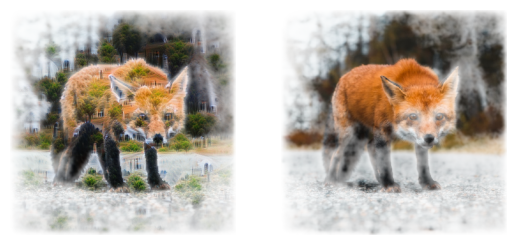

 61%|██████    | 60/99 [00:09<00:05,  7.23it/s]

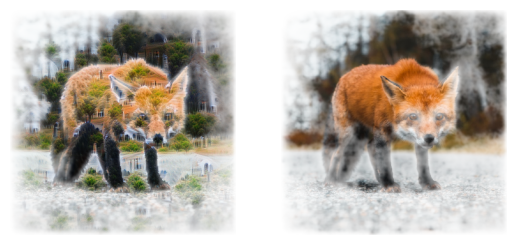

 71%|███████   | 70/99 [00:11<00:04,  7.21it/s]

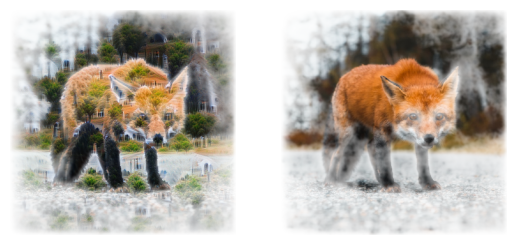

 81%|████████  | 80/99 [00:12<00:02,  7.23it/s]

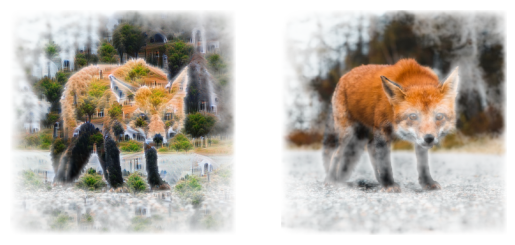

 91%|█████████ | 90/99 [00:14<00:01,  7.18it/s]

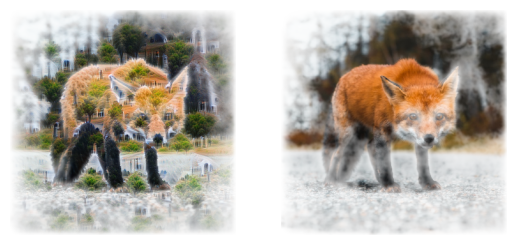

 99%|█████████▉| 98/99 [00:15<00:00,  6.97it/s]

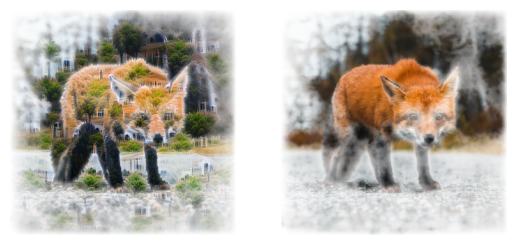

100%|██████████| 99/99 [00:15<00:00,  6.23it/s]


In [12]:
imgs, img_trs, _, _ = render.render_vis(model, 
                      "mixed4a:475",
                      init_img = 'test_images/fox.jpg',
                      accent_reg_layer = 'conv2d2',
                      accent_reg_alpha = 1.
                      )

### Finer control

#### no augmentations or parameterization

  0%|          | 0/151 [00:00<?, ?it/s]

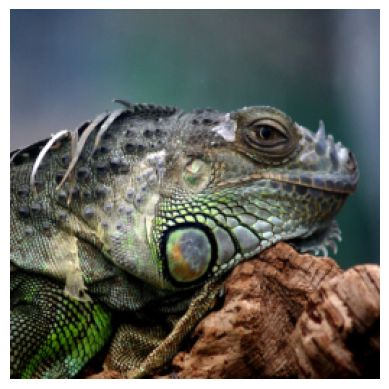

 13%|█▎        | 19/151 [00:01<00:09, 14.28it/s]

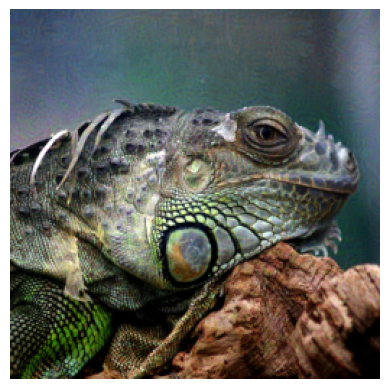

 26%|██▌       | 39/151 [00:03<00:07, 14.05it/s]

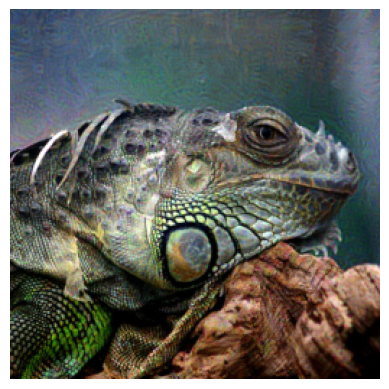

 39%|███▉      | 59/151 [00:04<00:06, 14.14it/s]

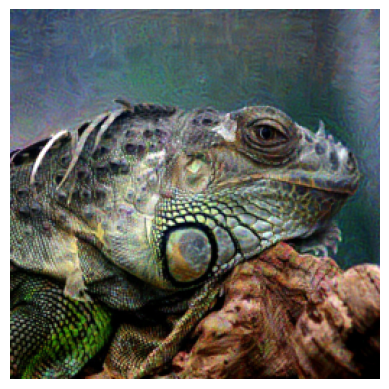

 52%|█████▏    | 79/151 [00:06<00:05, 14.12it/s]

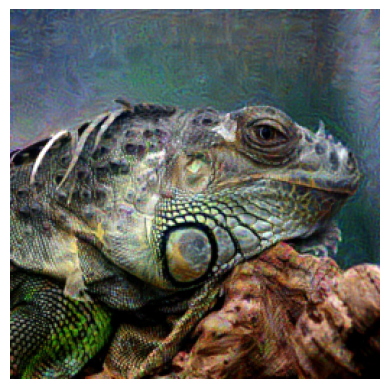

 66%|██████▌   | 99/151 [00:07<00:03, 14.17it/s]

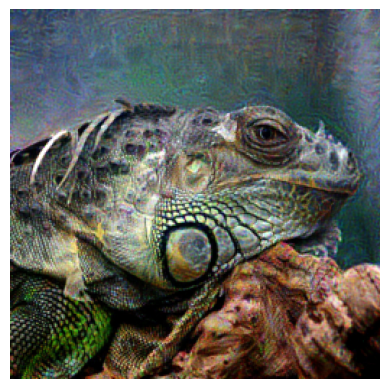

 79%|███████▉  | 119/151 [00:09<00:02, 14.16it/s]

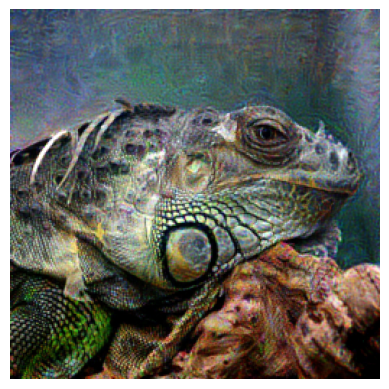

 92%|█████████▏| 139/151 [00:11<00:00, 14.11it/s]

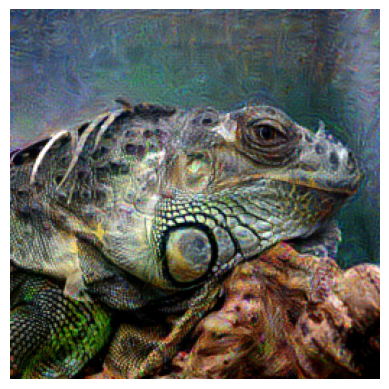

 99%|█████████▊| 149/151 [00:11<00:00, 13.43it/s]

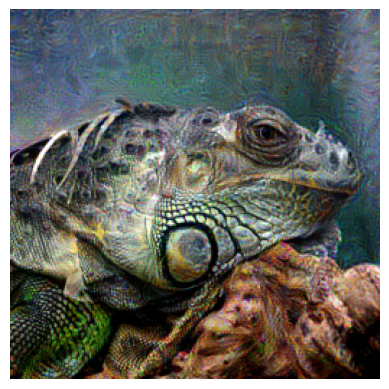

100%|██████████| 151/151 [00:12<00:00, 12.41it/s]


In [13]:
#activation maximization only

#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.pixel(init_img='./test_images/iguana.jpg',
                            color_decorrelate=False,
                            device=DEVICE)

#what augmentation scheme do you apply?
transforms = [] #no augmentations

#objective what are you trying to maximize in the model?
layer = 'softmax2_pre_activation_matmul'
label = 'terrapin'
unit = category_targets.index(label)
obj = objectives.channel(layer,unit)


_ = render.render_vis(model,
                      obj,
                      parameterizer,
                      transforms = transforms,
                      out_thresholds = [150],
                      inline_thresholds = range(0,150,20),
                      trans_p=0)

#### fourier phase parameterization

  0%|          | 0/151 [00:00<?, ?it/s]

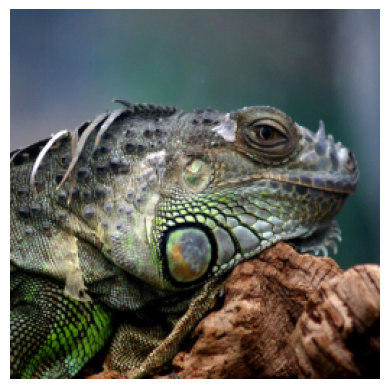

 13%|█▎        | 19/151 [00:01<00:09, 13.82it/s]

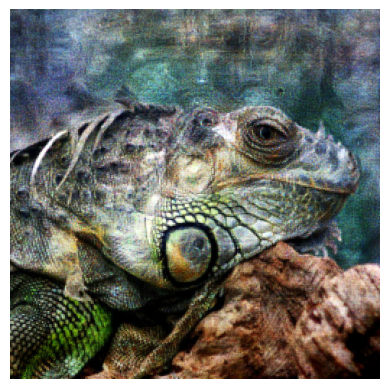

 26%|██▌       | 39/151 [00:03<00:08, 13.41it/s]

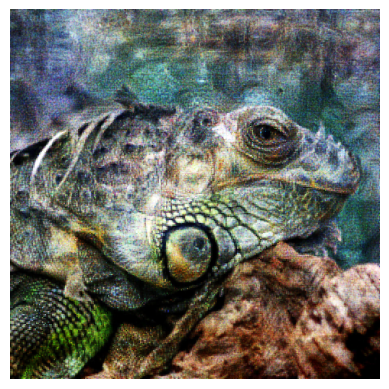

 39%|███▉      | 59/151 [00:04<00:06, 13.43it/s]

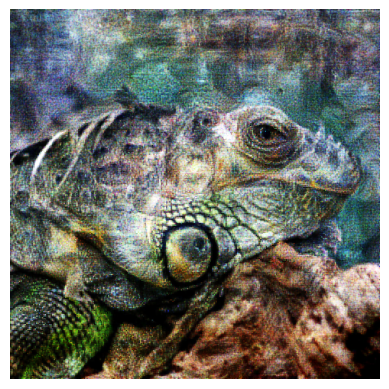

 52%|█████▏    | 79/151 [00:06<00:05, 13.43it/s]

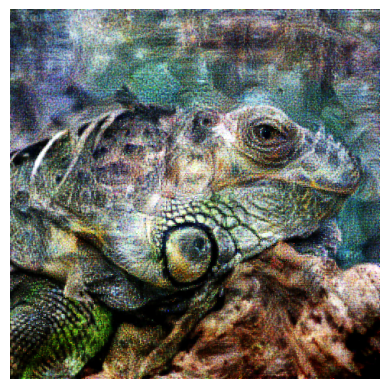

 66%|██████▌   | 99/151 [00:07<00:03, 13.41it/s]

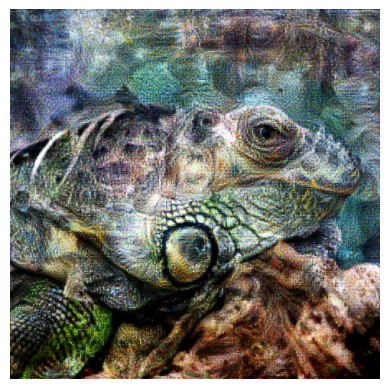

 79%|███████▉  | 119/151 [00:09<00:02, 13.39it/s]

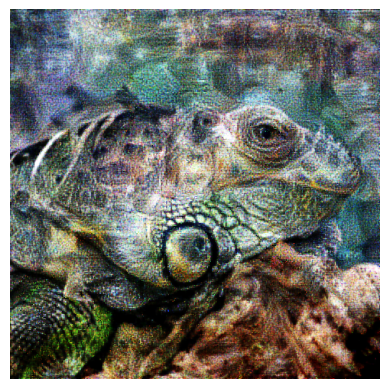

 92%|█████████▏| 139/151 [00:11<00:00, 13.37it/s]

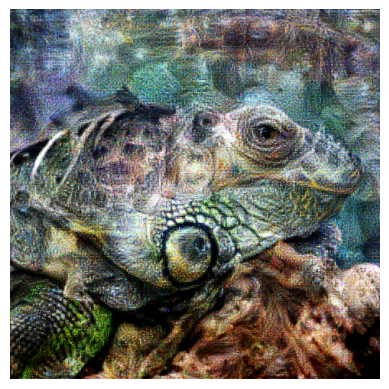

 99%|█████████▊| 149/151 [00:12<00:00, 12.66it/s]

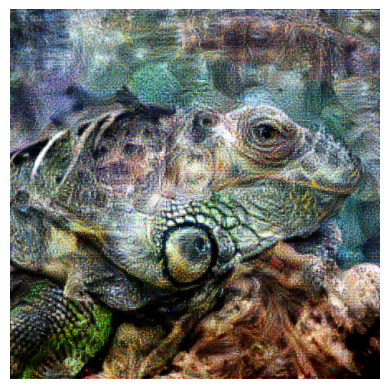

100%|██████████| 151/151 [00:12<00:00, 12.10it/s]


In [15]:
#fourier with decorrelated color space

#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.fourier_phase(init_img='./test_images/iguana.jpg',
                              device=DEVICE)

#what augmentation scheme do you apply?
transforms = [] #no augmentations

#objective what are you trying to maximize in the model?
obj = objectives.channel(layer,unit)


_ = render.render_vis(model,
                      obj,
                      parameterizer,
                      transforms = transforms,
                      out_thresholds = [150],
                      inline_thresholds = range(0,150,20),
                      trans_p=0)

#### augmentations

##### box crop transformations

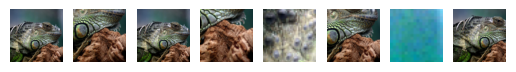

In [17]:
#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.fourier(init_img='./test_images/iguana.jpg',
                              device=DEVICE)

#what augmentation scheme do you apply?
transforms = [transform.box_crop_2(box_min_size=.05,
                                   box_max_size = .99),
              transform.resize((512,512))]
transform_f = transform.compose(transforms,nb_transforms=8)


transformed_images = transform_f(parameterizer.params_to_img())

from faccent.utils import show
show(transformed_images)

##### jitter transformations

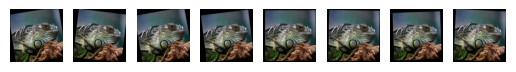

In [6]:
#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.fourier(init_img='./test_images/iguana.jpg',
                              device=DEVICE)

#what augmentation scheme do you apply?
transforms = transform.standard_jitter_transforms+[transform.resize((512,512))]
transform_f = transform.compose(transforms,nb_transforms=8)


transformed_images = transform_f(parameterizer.params_to_img())

from faccent.utils import show
show(transformed_images)

#### optimize with custom  parameterization, transforms, and regularization

  0%|          | 0/151 [00:00<?, ?it/s]

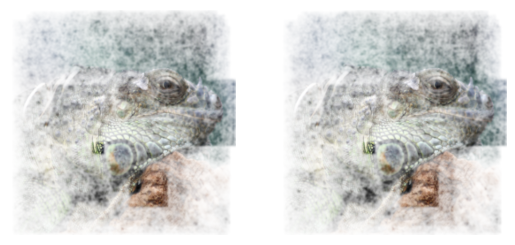

 13%|█▎        | 20/151 [00:02<00:14,  9.24it/s]

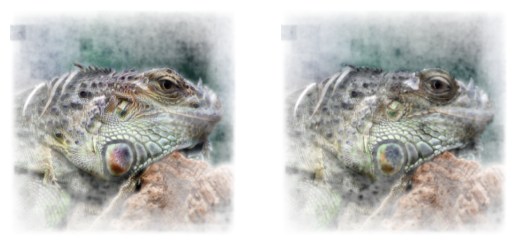

 26%|██▋       | 40/151 [00:04<00:11,  9.25it/s]

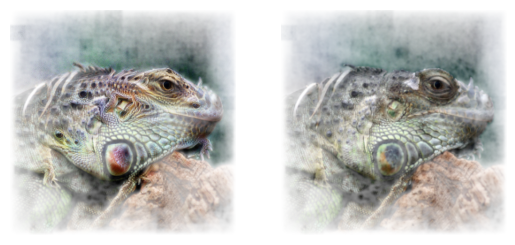

 40%|███▉      | 60/151 [00:07<00:09,  9.23it/s]

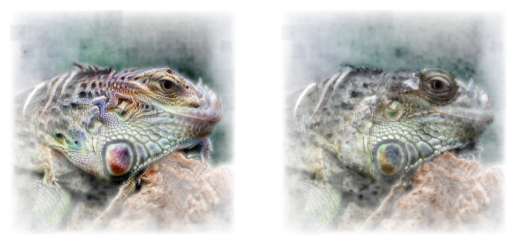

 53%|█████▎    | 80/151 [00:09<00:07,  9.26it/s]

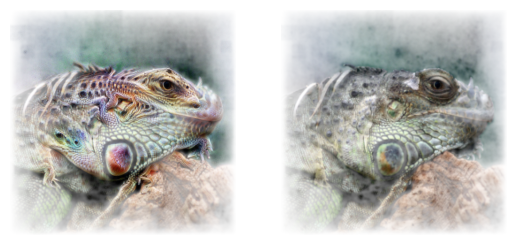

 66%|██████▌   | 100/151 [00:11<00:05,  9.23it/s]

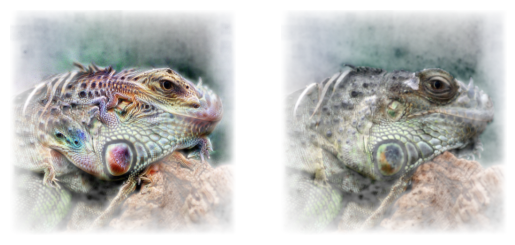

 79%|███████▉  | 120/151 [00:14<00:03,  9.30it/s]

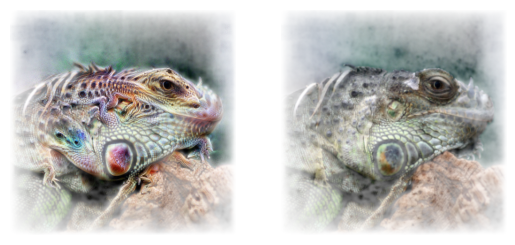

 93%|█████████▎| 140/151 [00:16<00:01,  9.26it/s]

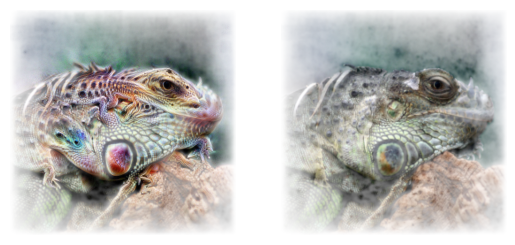

 99%|█████████▉| 150/151 [00:17<00:00,  9.06it/s]

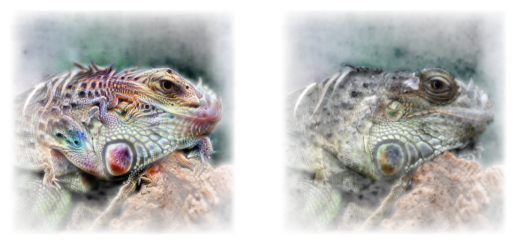

100%|██████████| 151/151 [00:18<00:00,  8.37it/s]


In [13]:
#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.fourier(init_img='./test_images/iguana.jpg',
                              device=DEVICE,
                              forward_init_img= True)  #for regularization

#what augmentation scheme do you apply?
transforms = [
              transform.box_crop_2(box_min_size=.05,
                                   box_max_size = .99),
              transform.uniform_gaussian_noise()
             ]


layer = 'softmax2_pre_activation_matmul'
label = 'whiptail'
unit = category_targets.index(label)

#objective what are you trying to maximize in the model?
obj1 = objectives.channel(layer,unit)    #maximization target
obj2 = objectives.l2_compare('mixed3a')           # regularization target
obj = obj1-.1*obj2


_ = render.render_vis(model,
                      obj,
                      parameterizer,
                      transforms = transforms,
                      out_thresholds = [150],
                      inline_thresholds = range(0,150,20),
                      trans_p=5)

#### neuron-wise visualization

  0%|          | 0/151 [00:00<?, ?it/s]

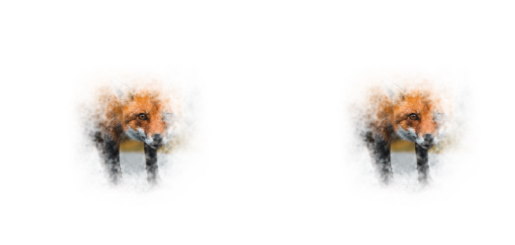

 13%|█▎        | 20/151 [00:03<00:19,  6.82it/s]

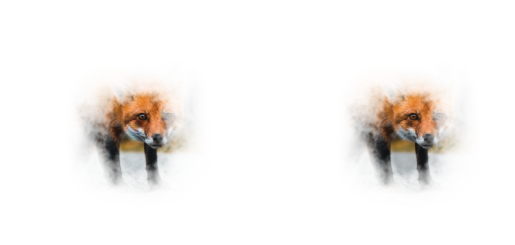

 26%|██▋       | 40/151 [00:06<00:16,  6.81it/s]

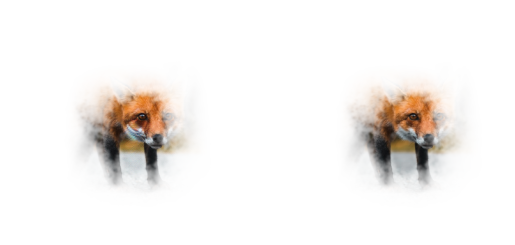

 40%|███▉      | 60/151 [00:09<00:13,  6.85it/s]

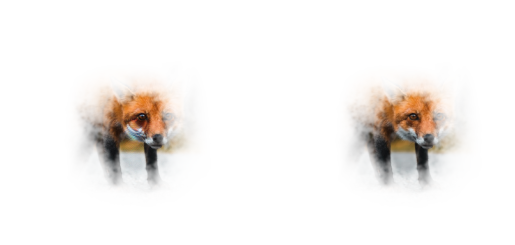

 53%|█████▎    | 80/151 [00:12<00:10,  6.80it/s]

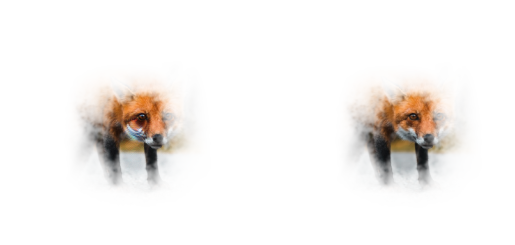

 66%|██████▌   | 100/151 [00:15<00:07,  6.80it/s]

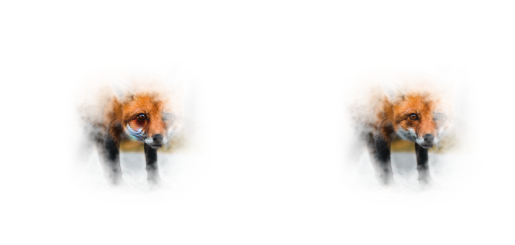

 79%|███████▉  | 120/151 [00:18<00:04,  6.82it/s]

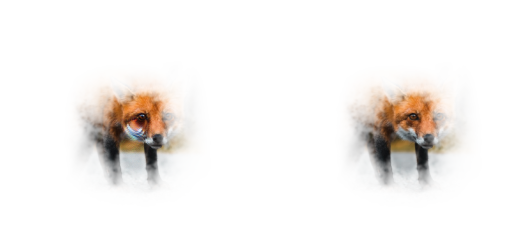

 93%|█████████▎| 140/151 [00:21<00:01,  6.80it/s]

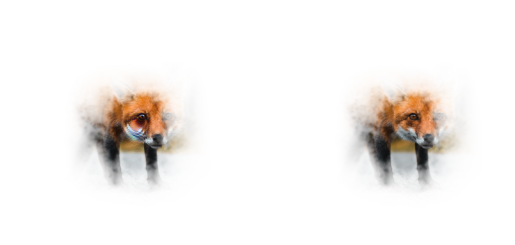

 99%|█████████▉| 150/151 [00:23<00:00,  6.72it/s]

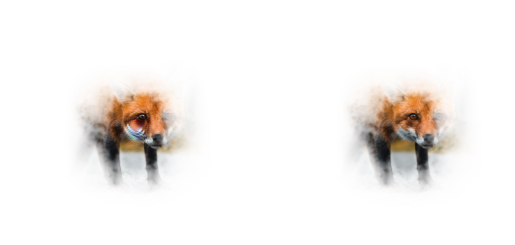

100%|██████████| 151/151 [00:23<00:00,  6.32it/s]


In [22]:
#in what space do we parameterization the image? (this is where we measure gradients)
parameterizer = param.fourier(init_img='./test_images/fox.jpg',
                              device=DEVICE,
                              forward_init_img= True)  #for regularization

#what augmentation scheme do you apply?
transforms = [
              transform.box_crop_2(box_min_size=.7,
                                   box_max_size = .99),
              transform.uniform_gaussian_noise()
             ]

obj1 = objectives.neuron('mixed4b',0) 
obj2 = objectives.l2_compare('mixed3a')     
obj = obj1-10*obj2


_ = render.render_vis(model,
                      obj,
                      parameterizer,
                      transforms = transforms,
                      out_thresholds = [150],
                      inline_thresholds = range(0,150,20),
                      trans_p=5,
                      img_tr_obj = obj1) # show transparency only with respect to maximization objective